In [2]:
from scipy.io import loadmat
import numpy as np
import pandas as pd
from collections import deque
import npp
import nascar_utility


pixdim[1,2,3] should be non-zero; setting 0 dims to 1


## sample gale shapley run

In [3]:
def gale_shapley(A, B, A_pref, B_pref):
    """Create a stable matching using the Gale-Shapley algorithm."""
    A_free = deque(A)
    A_match = {}
    B_match = {}
    while A_free:
        a = A_free.popleft()
        b = A_pref[a].pop(0)
        if b not in B_match:
            A_match[a] = b
            B_match[b] = a
        else:
            a_prime = B_match[b]
            if B_pref[b].index(a) < B_pref[b].index(a_prime):
                A_match[a] = b
                B_match[b] = a
                del A_match[a_prime]
                A_free.append(a_prime)
            else:
                A_free.append(a)
    return [(a, b) for a, b in A_match.items()]

In [4]:
A={"S.Samuel", "S.Bobby", "S.John"}
B={"F.Smith", "F.Martinez", "F.Brown"}
A_pref={
    "S.Samuel": ["F.Smith", "F.Brown", "F.Martinez"],
    "S.Bobby": ["F.Martinez", "F.Brown", "F.Smith"],
    "S.John": ["F.Martinez", "F.Brown", "F.Smith"],
}
B_pref={
    "F.Smith": ["S.Samuel", "S.John", "S.Bobby"],
    "F.Martinez": ["S.Samuel", "S.Bobby", "S.John"],
    "F.Brown": ["S.John", "S.Samuel", "S.Bobby"],
}

In [5]:
gale_shapley(A, B, A_pref, B_pref)

[('S.Samuel', 'F.Smith'), ('S.Bobby', 'F.Martinez'), ('S.John', 'F.Brown')]

## Match task 1 components to task 2 components

In [6]:
def load_good_components(task):
    outputs_file=f'../data/nascar_output/all_ses-HBNsiteRU_task-{task}_results.mat'
    component_list_file=f'../data/nascar_output/all_ses-HBNsiteRU_task-{task}_good_components.txt'
    mat_contents = loadmat(outputs_file)
    U2=mat_contents['U2']
    components=U2[0][0]

    with open(f'{component_list_file}', 'r') as f:
        # read the contents of the file into a list
        component_list = [int(line.strip()) for line in f.readlines()]
    #make it 0-indexed since we are in python
    #component_list= [x - 1 for x in component_list]

    return components, component_list

In [7]:
def run_shapley(tasks):
    #input is a list of 2 task names
    task_1_c, task_1_c_list=load_good_components(tasks[0])
    task_2_c, task_2_c_list=load_good_components(tasks[1])
    c_xcorr=npp.xcorr(task_1_c.T,task_2_c.T)
    c_xcorr_abs=np.abs(c_xcorr)

    # A = set([f'{tasks[0]}_{i}' for i in range(1, 18)])
    # B = set([f'{tasks[1]}_{i}' for i in range(1, 18)])
    A = set([f'{tasks[0]}_{i}' for i in task_1_c_list])
    B = set([f'{tasks[1]}_{i}' for i in task_2_c_list])
    A_pref={}
    B_pref={}

    #loop through task 1
    for t in task_1_c_list:
        indices = np.argsort(c_xcorr_abs[t-1,[tt-1 for tt in task_2_c_list]])[::-1]
        A_pref[f'{tasks[0]}_{t}']=[f'{tasks[1]}_{task_2_c_list[i]}' for i in indices]
    #loop through task 2
    for t in task_2_c_list:
        indices = np.argsort(c_xcorr_abs[[tt-1 for tt in task_1_c_list],t-1])[::-1]
        B_pref[f'{tasks[1]}_{t}']=[f'{tasks[0]}_{task_1_c_list[i]}' for i in indices]


    matches=gale_shapley(A, B, A_pref, B_pref)
    positive_list=[]
    for m in matches:
        task1, task1_c = m[0].rsplit('_', 1)
        task2, task2_c = m[1].rsplit('_', 1)
        if (c_xcorr[int(task1_c)-1,int(task2_c)-1]) > 0:
            positive_list.append(1)
        else:
            positive_list.append(-1)
    #return matches, A, B, A_pref, B_pref, c_xcorr, task_1_c_list, task_2_c_list
    return matches, positive_list

In [8]:
#task='movieTP'
#task='rest_run-1'
#tasks=['rest_run-1','movieTP']
#tasks=['rest_run-1','rest_run-2']
tasks=['rest_run-1','movieTP']

matches, positive_list=run_shapley(tasks)
#matches, A, B, A_pref, B_pref, c_xcorr, task_1_c_list, task_2_c_list=run_shapley(tasks)

In [9]:
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np
import seaborn as sns
sns.set("paper", "white")
#%matplotlib inline
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

In [10]:
task_1_c, task_1_c_list=load_good_components('movieDM')


In [13]:
task_1_c_list

[1, 2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 17, 18, 20, 21, 22, 23, 25]

In [ ]:

fig = plt.figure(figsize=(15, 70))
plt.title('wall of brains tensor decomposition DM')
gs = gridspec.GridSpec(17, 2, wspace=0, hspace=0.1, top=0.95, bottom=0.05, left=0.17, right=0.845) 

fig_dir='../outputs/figures/HBN_23/'

for t in enumerate(task_1_c_list):
    task1, task1_c = m[0].rsplit('_', 1)
    task2, task2_c = m[1].rsplit('_', 1)
    img = Image.open(f'{fig_dir}{task1}_hbn_rank{task1_c}_tensor_decomp.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,0])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{tasks[0]} {task1_c}',fontsize=20,c='k')
    
    if positive_list[i] == 1:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{task2_c}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{task2_c}_tensor_decomp_inv.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,1])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{tasks[1]} {task2_c}',fontsize=20,c='k')

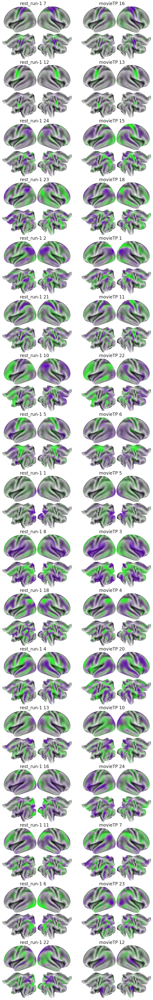

In [9]:
fig = plt.figure(figsize=(15, 70))
plt.title('wall of brains tensor decomposition')
gs = gridspec.GridSpec(17, 2, wspace=0, hspace=0.1, top=0.95, bottom=0.05, left=0.17, right=0.845) 

fig_dir='../outputs/figures/HBN_23/'

for i,m in enumerate(matches):
    task1, task1_c = m[0].rsplit('_', 1)
    task2, task2_c = m[1].rsplit('_', 1)
    img = Image.open(f'{fig_dir}{task1}_hbn_rank{task1_c}_tensor_decomp.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,0])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{tasks[0]} {task1_c}',fontsize=20,c='k')
    
    if positive_list[i] == 1:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{task2_c}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{task2_c}_tensor_decomp_inv.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,1])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{tasks[1]} {task2_c}',fontsize=20,c='k')

## make a figure matching 3! and include subcortical

In [10]:
#task='movieTP'
task='rest_run-1'
task2='rest_run-2'
task3='movieTP'

#tasks=['rest_run-1','movieTP']
#tasks=['rest_run-1','rest_run-2']
tasks1=['rest_run-1','rest_run-2']
tasks2=['rest_run-1','movieTP']

matches1, positive_list1=run_shapley(tasks1)
matches2, positive_list2=run_shapley(tasks2)

O,Y,components,temporal_modes,contributions,lambda2=nascar_utility.load_nascar(task)
component_list=nascar_utility.load_components_list(task)
#matches, A, B, A_pref, B_pref, c_xcorr, task_1_c_list, task_2_c_list=run_shapley(tasks)

In [11]:
component_list

[1, 2, 4, 5, 6, 7, 8, 10, 11, 12, 13, 16, 18, 21, 22, 23, 24]

In [12]:
component_list_mag=[]
for c in component_list:
    component_list_mag.append(lambda2[c-1,0])
zipped = zip(component_list_mag, component_list)
zipped = sorted(zipped,reverse=True)
_, component_list_ordered = zip(*zipped)

In [13]:
component_list_ordered

(1, 4, 2, 18, 8, 16, 13, 6, 11, 12, 5, 10, 7, 22, 23, 24, 21)

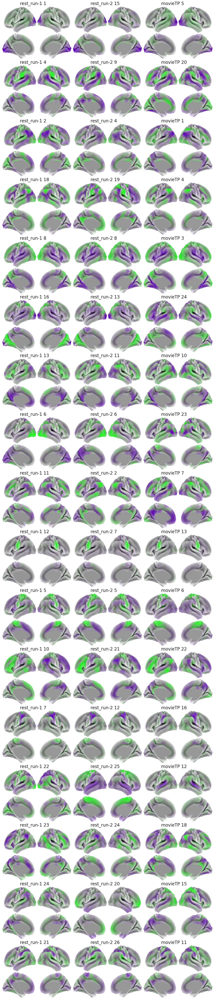

In [14]:
matches1_1, matches1_2 = zip(*matches1)
matches2_1, matches2_2 = zip(*matches2)
fig_dir='../outputs/figures/HBN_23_medial_midthickness/'

fig = plt.figure(figsize=(20, 70))
plt.title('wall of brains tensor decomposition')
gs = gridspec.GridSpec(17, 3, wspace=0, hspace=0.1, top=0.95, bottom=0.05, left=0.17, right=0.845) 
for i,c in enumerate(component_list_ordered):
    index = matches1_1.index(f"{task}_{c}")
    cc=matches1_1[index].rsplit('_', 1)[1]    
    cc2=matches1_2[index].rsplit('_', 1)[1]
    index2 = matches2_1.index(f"{task}_{c}")
    cc3=matches2_2[index2].rsplit('_', 1)[1]    
    
    img = Image.open(f'{fig_dir}{task}_hbn_rank{cc}_tensor_decomp.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,0])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{task} {cc}',fontsize=20,c='k')

    if positive_list1[index] == 1:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{cc2}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{cc2}_tensor_decomp_inv.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,1])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{task2} {cc2}',fontsize=20,c='k')
    
    if positive_list2[index2] == 1:
        img = Image.open(f'{fig_dir}{task3}_hbn_rank{cc3}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task3}_hbn_rank{cc3}_tensor_decomp_inv.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,2])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{task3} {cc3}',fontsize=20,c='k')
fig.savefig(f'../outputs/figures/results/gale_shapley.png',bbox_inches='tight')
    
component_names=[('visual',-1),
                ]

In [15]:
labelled_components=[(1, 'Visual', -1),
 (4, 'Language', -1),
 (2, 'DMN 2', -1),
 (18, 'DMN?', -1),
 (8, 'Visual Dorsal', 1),
 (16, 'Visual', -1),
 (13, 'Language?', 1),
 (6, 'Visual', 1),
 (11, 'Frontoparietal', 1),
 (12, 'SMN', 1),
 (5, 'SMN', 1),
 (10, 'DMN 3', 1),
 (7, 'SMN', -1),
 (22, 'Visual//Auditory', 1),
 (23, 'Multimodal',1 ),
 (24, 'GS', 1),
 (21, 'Dorsal Attention', -1)]

In [16]:
for rest1_n, c_name, factor  in labelled_components:
    index2 = matches2_1.index(f"{task}_{rest1_n}")
    cc3=matches2_2[index2].rsplit('_', 1)[1] 
    print(f'{cc3},')

5,
20,
1,
4,
3,
24,
10,
23,
7,
13,
6,
22,
16,
12,
18,
15,
11,


In [20]:

indices=[0, 2, 9]
#indices=np.arange(len(labelled_components))

In [21]:
positive_list1

[-1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, -1, -1]

In [ ]:
fig = plt.figure(figsize=(20, 70))
plt.title('wall of brains tensor decomposition')
gs = gridspec.GridSpec(17, 3, wspace=0, hspace=0.1, top=0.95, bottom=0.05, left=0.17, right=0.845) 
#for i,c in enumerate(component_list_ordered):
for i,f in enumerate(indices):
    factor=labelled_components[f][2]
    c_name=labelled_components[f][1]
    c=component_list_ordered[f]
    
    index = matches1_1.index(f"{task}_{c}")
    cc=matches1_1[index].rsplit('_', 1)[1]    
    cc2=matches1_2[index].rsplit('_', 1)[1]
    index2 = matches2_1.index(f"{task}_{c}")
    cc3=matches2_2[index2].rsplit('_', 1)[1]    
    
    
    if factor == 1:
        img = Image.open(f'{fig_dir}{task}_hbn_rank{cc}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task}_hbn_rank{cc}_tensor_decomp_inv.png')
    #img = Image.open(f'{fig_dir}{task}_hbn_rank{cc}_tensor_decomp.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,0])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{task} {c_name}',fontsize=20,c='k')

    if positive_list1[index]*factor == 1:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{cc2}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task2}_hbn_rank{cc2}_tensor_decomp_inv.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,1])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{task2} {c_name}',fontsize=20,c='k')
    
    if positive_list2[index2]*factor == 1:
        img = Image.open(f'{fig_dir}{task3}_hbn_rank{cc3}_tensor_decomp.png')
    else:
        img = Image.open(f'{fig_dir}{task3}_hbn_rank{cc3}_tensor_decomp_inv.png')
    area = (0, 0, 1118, 840) #crop out the bar on right
    img = img.crop(area)
    ax= plt.subplot(gs[i,2])
    ax.imshow(img)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.axis('off')
    ax.text(290,-20,f'{task3} {c_name}',fontsize=20,c='k')
    
# component_names=[('visual',-1),
#                 ]